# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 28.03.2024

Мягкий дедлайн: 15.04.2024 23:59 MSK

Жёсткий дедлайн: 21.04.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). 

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [1]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

In [3]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [11]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        D = np.diag(X.sum(axis=1))
        L = D - X
        eigin_vals, eigen_vectors = np.linalg.eigh(L)
        return eigen_vectors[:, :self.n_components]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [12]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [13]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [14]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [15]:
from collections import defaultdict
from scipy.spatial.distance import cdist

In [16]:
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''

    routes = defaultdict(list)

    for i in data.index:
        route_numbers = data.loc[i, "RouteNumbers_en"].split(";")
        for rn in route_numbers:
            routes[rn.strip()].append(i)
    
    return routes


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    sorted_routes = {}
    for num in routes.keys():
        sorted_stops = []
        used_stops = set()

        route_stops_df = data.loc[routes[num], ['Latitude_WGS84_en', 'Longitude_WGS84_en']]
        distances = cdist(route_stops_df, route_stops_df, metric='euclidean')

        best_stop_idx = np.argmax(distances.sum(0))
        sorted_stops.append(routes[num][best_stop_idx])
        used_stops.add(best_stop_idx)

        while len(sorted_stops) != len(routes[num]):
            nearest_stop_dist = 1e6
            nearest_stop = 1e6
            for i in range(distances.shape[0]):
                if distances[best_stop_idx, i] < nearest_stop_dist and i not in used_stops:
                    nearest_stop_dist = distances[best_stop_idx, i]
                    nearest_stop = i
            best_stop_idx = nearest_stop
            sorted_stops.append(routes[num][best_stop_idx])
            used_stops.add(best_stop_idx)
        sorted_routes[num] = sorted_stops
    
    return sorted_routes



def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    adjacency_matrix = np.zeros((data.shape[0], data.shape[0]))
    for index in sorted_routes.keys():
        for i in range(len(sorted_routes[index]) - 1):
            adjacency_matrix[sorted_routes[index][i], sorted_routes[index][i + 1]] += 1
            adjacency_matrix[sorted_routes[index][i + 1], sorted_routes[index][i]] += 1
    return adjacency_matrix

In [17]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [19]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=10):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [12]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    m = folium.Map(location=[55.75215, 37.61819], zoom_start=12)
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
              'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue',
              'darkpurple', 'pink', 'lightblue', 'lightgreen', 'gray',
              'black', 'lightgray']
    for i, row in data.iterrows():
        folium.Marker(location=[row['Latitude_WGS84_en'], row['Longitude_WGS84_en']],
                      icon=folium.Icon(color=colors[labels[i] % len(colors)])).add_to(m)

    return m

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [13]:
from sklearn.cluster import KMeans, DBSCAN


In [14]:
labels = KMeans(n_clusters=12).fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
draw_clustered_map(data, labels)

In [15]:
labels_dbscan = DBSCAN(eps=0.0035).fit_predict(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']])
draw_clustered_map(data, labels_dbscan)

In [16]:
labels = GraphClustering(n_clusters=40, n_components = 15).fit_predict(adjacency_matrix)
draw_clustered_map(data, labels)

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:** Как можно увидеть на карте, KNN сделала элипсовидные области разбиения, у DBSCAN получились более непонятные области разбиения, потому что достаточно сложно подобрать $\epsilon$, чтобы были более логичные кластеры. У GraphClustering кластеры чем-то похожи на структуру дорог.

Из плюсов KNN можно выделить то, что кластеры интерпретируемой формы. Спектральная кластеризация больше остальных похожа на маршруты дорог, поэтому для этой задачи она подходит лучше остальных ввариантов. А DBSCAN сделал вообще что-то странное

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [17]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1564,sport,252.txt,Ferguson rues failure to cut gap,Boss Sir Alex Ferguson was left ruing Manches...
697,entertainment,188.txt,Celebrities get their skates on,Former England footballer Paul Gascoigne will...
1785,sport,473.txt,Faultless Federer has no equal,"Roger Federer - nice bloke, fantastic tennis ..."
1299,politics,404.txt,Tory candidate quits over remark,A Conservative election challenger is quittin...
364,business,365.txt,Nasdaq planning $100m-share sale,The owner of the technology-dominated Nasdaq ...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [18]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [19]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/polinakadeyshvili/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/polinakadeyshvili/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/polinakadeyshvili/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [20]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [21]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [22]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

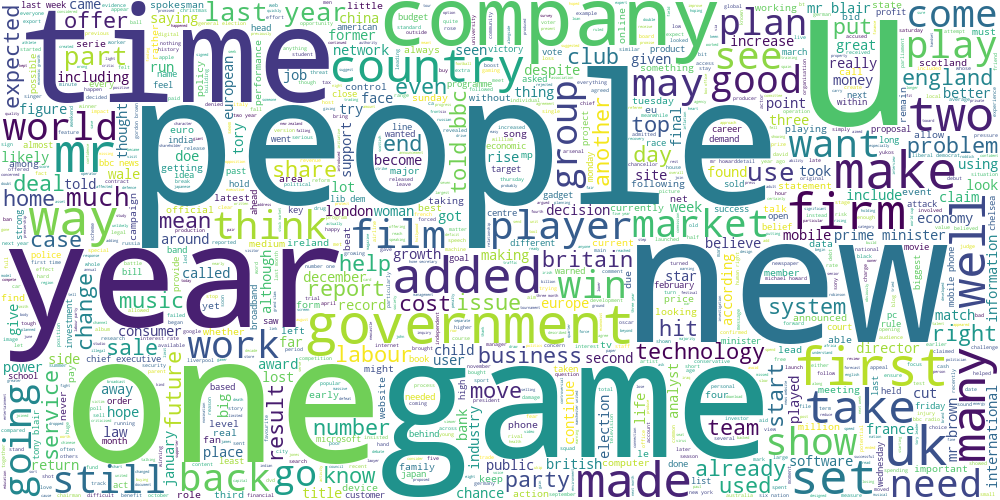

In [23]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** Кластеры получились вполне интерпретируемыми, например, можно выделить темы, политика, спорт, кино, финансы, технологии

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [25]:
vectorizer = TfidfVectorizer(min_df=5)
vector_texts = vectorizer.fit_transform(data['text'])
kmeans = KMeans(n_clusters=8).fit(vector_texts)
labels = kmeans.predict(vector_texts)

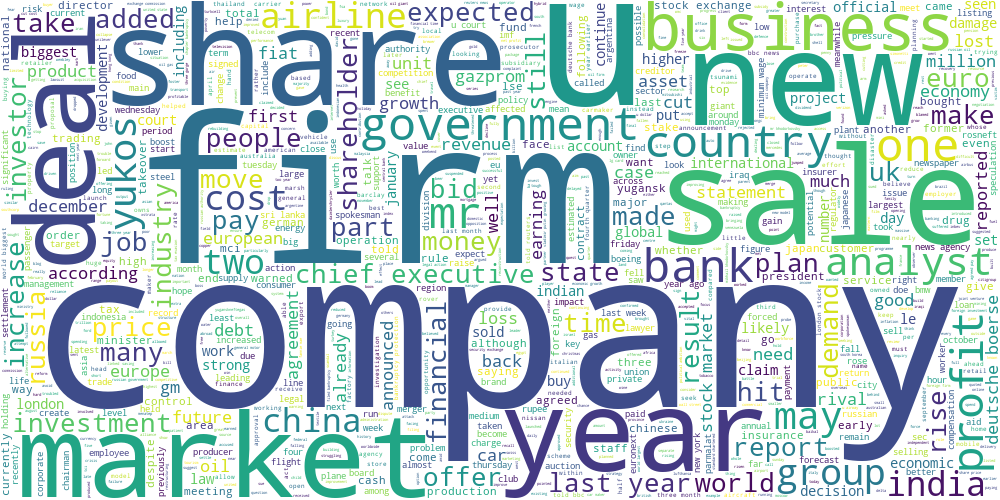

In [26]:
draw_wordcloud(data[labels == 0].text)

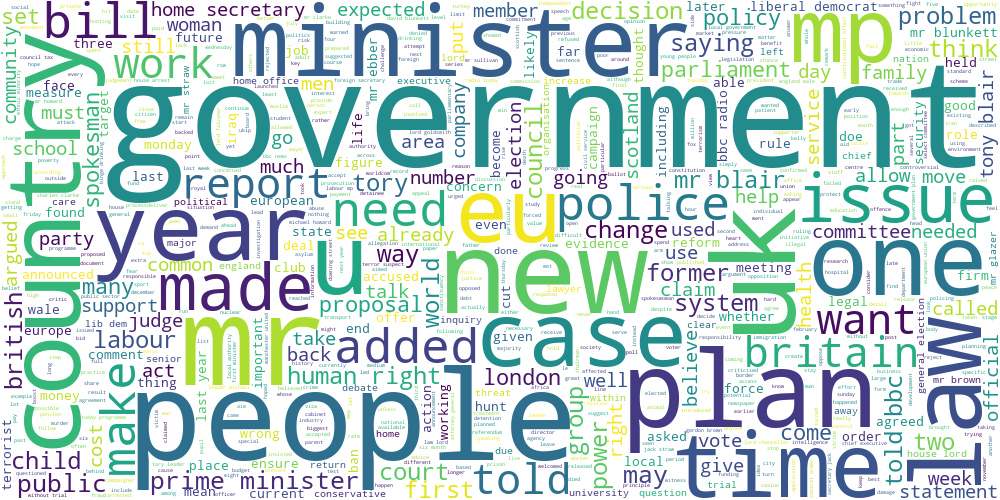

In [27]:
draw_wordcloud(data[labels == 1].text)

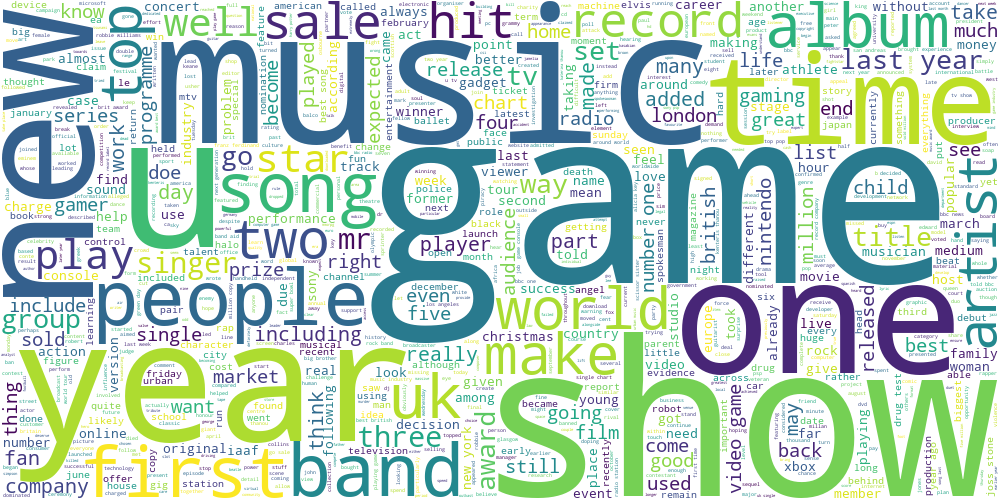

In [28]:
draw_wordcloud(data[labels == 2].text)

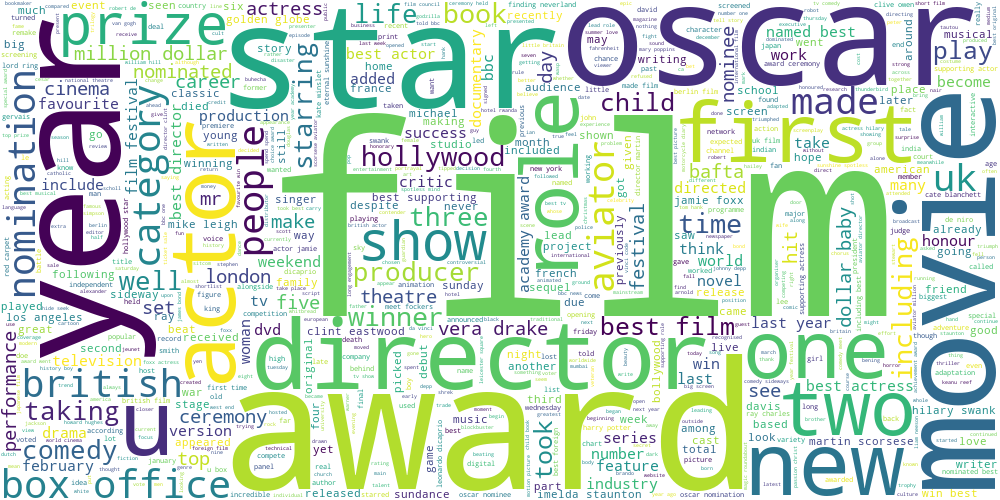

In [29]:
draw_wordcloud(data[labels == 3].text)

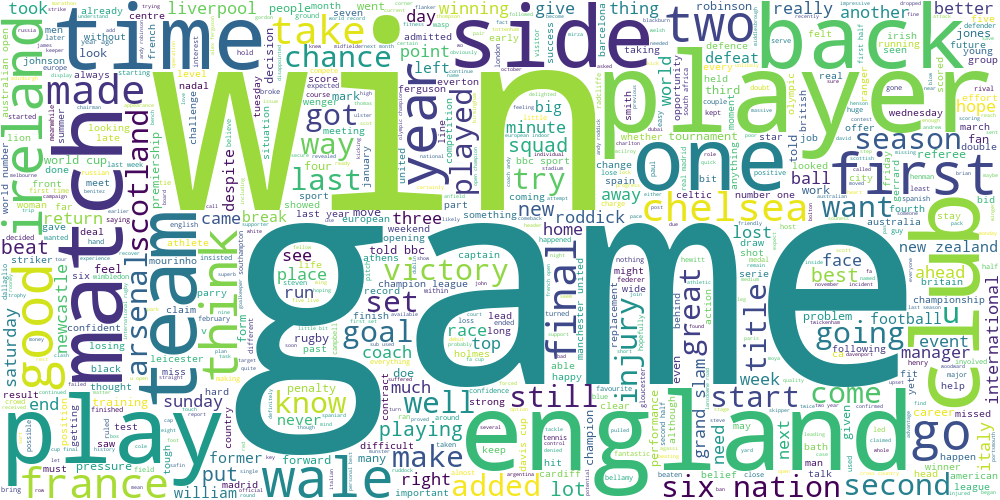

In [30]:
draw_wordcloud(data[labels == 4].text)

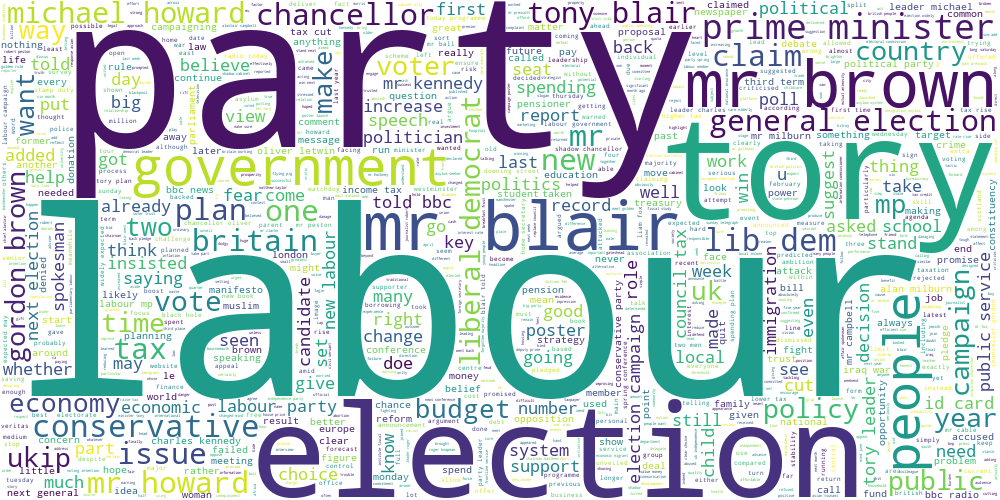

In [31]:
draw_wordcloud(data[labels == 5].text)

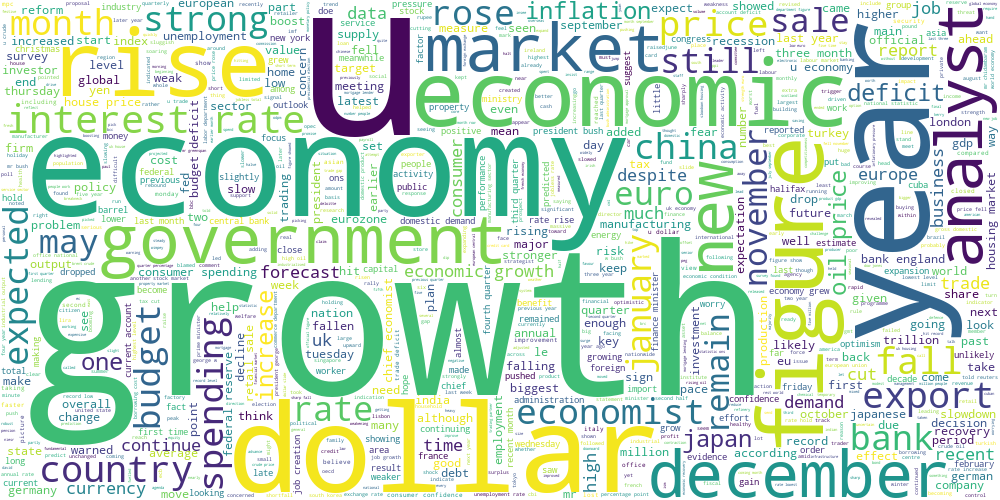

In [32]:
draw_wordcloud(data[labels == 6].text)

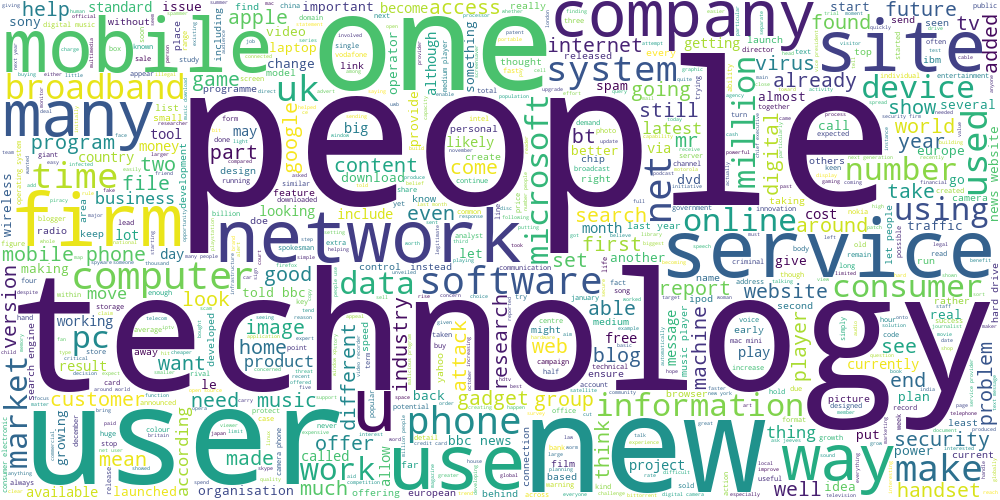

In [33]:
draw_wordcloud(data[labels == 7].text)

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** Да, эти центры класстеров согласуются с результатом выше, по ним становится ясно, что темы, описанные выше тоже были правильными

In [34]:
idx_to_word = vectorizer.get_feature_names_out()

for i, vec in enumerate(kmeans.cluster_centers_):
    print(i, ' '.join(idx_to_word[np.argsort(vec)[::-1][:10]]))

0 company firm share profit bank sale market year yukos airline
1 mr government lord would minister law blair eu mp people
2 game music show band album year chart song one tv
3 film award best oscar actor festival star actress director movie
4 game england player win match cup club team champion injury
5 labour election mr party tory blair brown tax howard would
6 economy growth rate price economic dollar figure deficit year rise
7 mobile phone technology people user service computer net software digital


**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [35]:
from sklearn.cluster import SpectralClustering

In [36]:
kmeans_labels = KMeans(n_clusters=8).fit_predict(vector_texts)


In [37]:
spect_labels = SpectralClustering(n_clusters=8).fit_predict(vector_texts)

In [38]:
dbscan_labels = DBSCAN(eps=0.88).fit_predict(vector_texts)

In [39]:
from sklearn.manifold import TSNE

In [40]:
tsne = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(vector_texts)

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

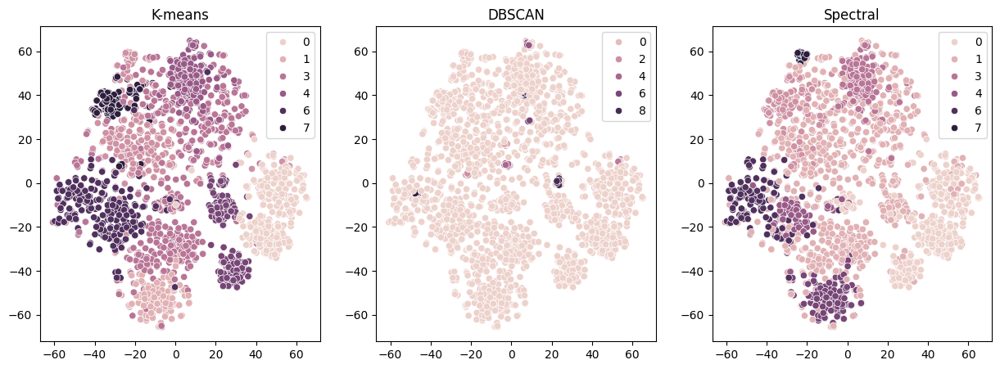

In [42]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

sns.scatterplot(x=tsne[:, 0], y=tsne[:, 1], ax = ax[0], hue = kmeans_labels)
sns.scatterplot(x=tsne[:, 0], y=tsne[:, 1],ax = ax[1],  hue = dbscan_labels)
sns.scatterplot(x=tsne[:, 0], y=tsne[:, 1], ax = ax[2], hue = spect_labels)


ax[0].set_title('K-means')
ax[1].set_title('DBSCAN')
ax[2].set_title('Spectral')

plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** Здесь, посмотрев на кластеры, становится ясно, что KNN работает лучше всего, потому что у него и хороший баланс классов, и обсласти разбиения интерпретируемые. DBSCAN почти все объекты отнес к одному класстеру, что очень плохо. Спектральная кластеризация сработала лучше DBSCAN, потому что там есть другие классы, которые внесли какой-то вклад, но при этом баланс классов все равно очень сбит, потому что большую часть занимает нулевой класс. 

Такая визуализация соотносится с визуализацией географических данных, потому что у KNN области получились шарообразной формы, DBSCAN тоже странное что-то дал, спектральная кластеризация выделила один основной класс и формы кластеров достаточно сложные для интерпретации

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:** Темы получились примерно такие же, но уже более узкие

In [43]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

In [44]:
bag_of_words = CountVectorizer().fit_transform(data['text'])
lda = LatentDirichletAllocation(n_components=16).fit(bag_of_words)
lda_labels = lda.transform(bag_of_words).argmax(axis=1)

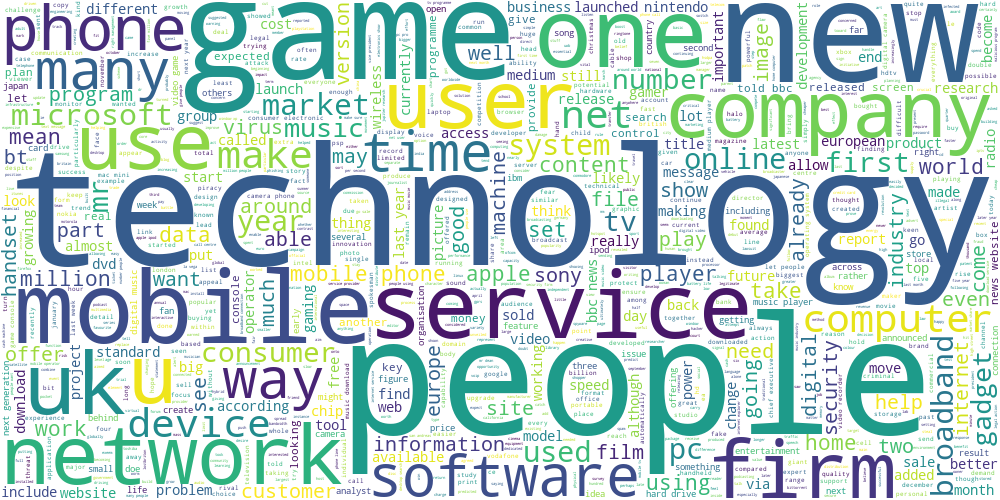

In [45]:
draw_wordcloud(data[lda_labels == 0].text)

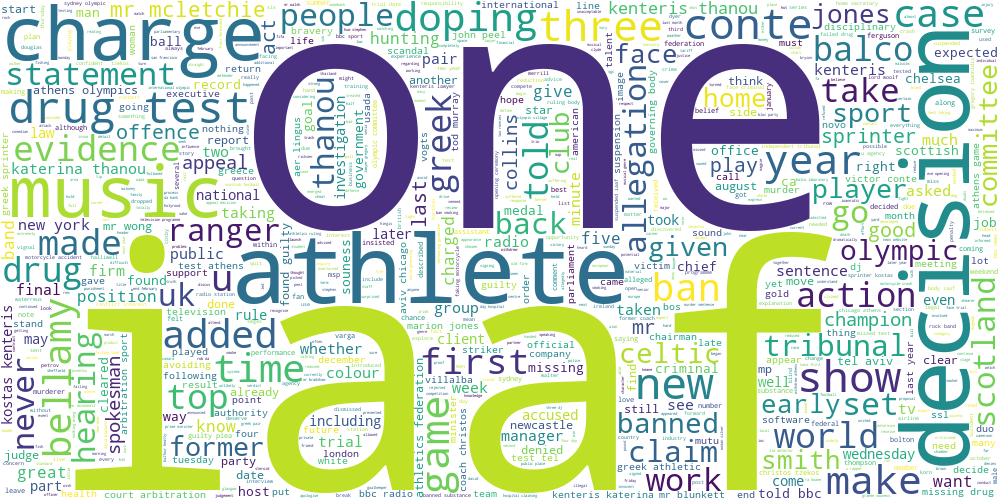

In [46]:
draw_wordcloud(data[lda_labels == 1].text)

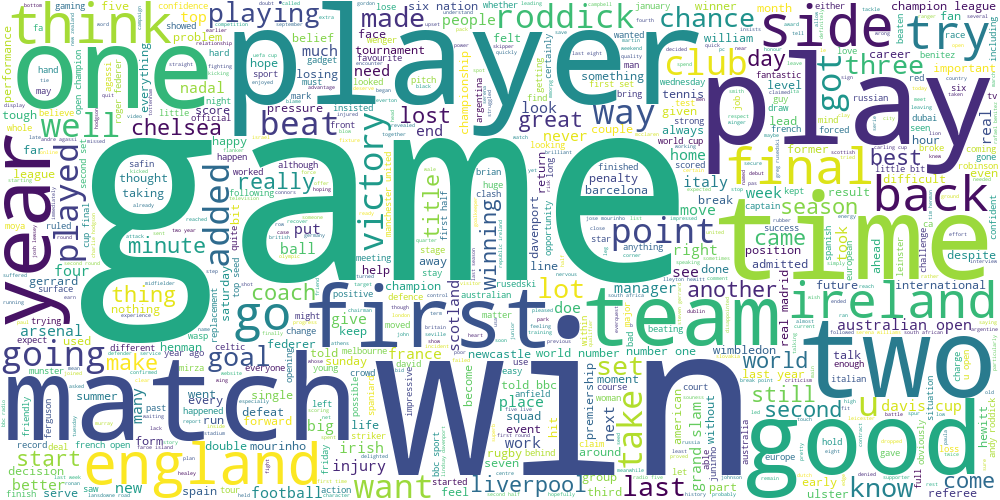

In [47]:
draw_wordcloud(data[lda_labels == 2].text)

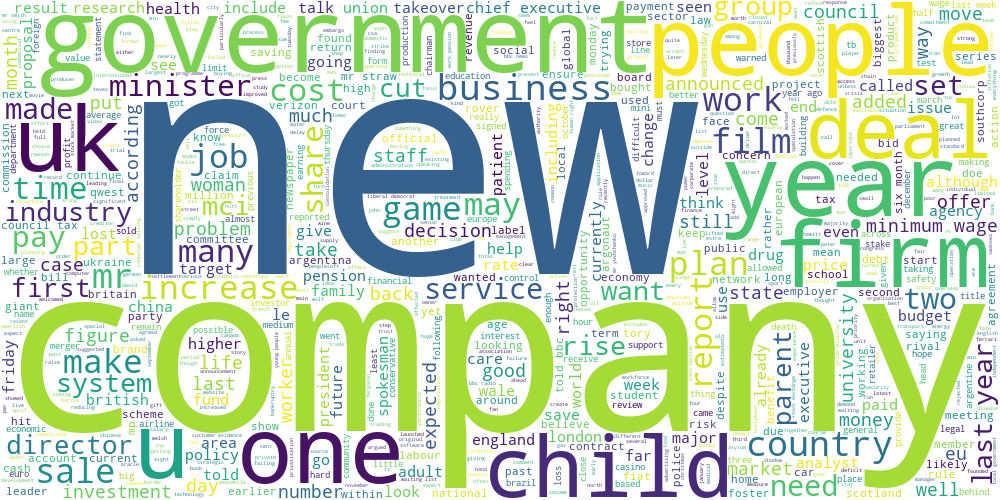

In [48]:
draw_wordcloud(data[lda_labels == 3].text)

In [49]:
num_clusters = len(np.unique(lda_labels))
cluster_word_counts = np.zeros((num_clusters, bag_of_words.shape[1]))
for doc_idx, cluster_label in enumerate(lda_labels):
    cluster_word_counts[cluster_label] += bag_of_words[doc_idx].toarray().squeeze()
idx_to_word = np.array(CountVectorizer().fit(data['text']).get_feature_names_out())

for i, cluster_word_count in enumerate(cluster_word_counts):
    print(f"Cluster {i}:")
    if sum(cluster_word_count) == 0:
        print("No words found.")
    else:
        top_word_indices = cluster_word_count.argsort()[:-11:-1]
        top_words = idx_to_word[top_word_indices]
        print(" ".join(top_words))

Cluster 0:
people mobile technology phone game new music service also year
Cluster 1:
would drug test mr kenteris iaaf year greek also thanou
Cluster 2:
game win player first year time one play two would
Cluster 3:
would year company government mr people new also could child
Cluster 4:
yukos world company russian race oil year second olympic european
Cluster 5:
firm lse deutsche market share boerse also new year stock
Cluster 6:
mr airline blog one year company also would world could
Cluster 7:
year company firm gm fiat new robot also mr share
Cluster 8:
minute united book first chance arsenal goal year shot rooney
Cluster 9:
year growth economy market price bank rate economic sale also
Cluster 10:
england wale game club player year six new first france
Cluster 11:
site people would search user net also mr attack could
Cluster 12:
mr government show company year firm also tobacco school film
Cluster 13:
would could chelsea people new rugby play scotland edinburgh year
Cluster 14:
mr wo

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [50]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

In [51]:
X_train, X_test, y_train, y_test = train_test_split(data.text, data.category, test_size=0.2)

In [52]:
tfidf = TfidfVectorizer(min_df=5)
tfidf.fit(X_train)
X_train_vec = tfidf.transform(X_train)
X_test_vec = tfidf.transform(X_test)

log_reg = LogisticRegression()
log_reg.fit(X_train_vec, y_train)
y_pred = log_reg.predict(X_test_vec)
y_pred_train = log_reg.predict(X_train_vec)
print("Train accuracy for log reg td-idf", accuracy_score(y_train, y_pred_train))
print("Test accuracy for log reg td-idf", accuracy_score(y_test, y_pred))

Train accuracy for log reg td-idf 0.998314606741573
Test accuracy for log reg td-idf 0.9662921348314607


In [53]:
kmeans = KMeans()
kmeans.fit(X_train_vec)
X_train_kmeans = kmeans.transform(X_train_vec)
X_test_kmeans = kmeans.transform(X_test_vec)
log_reg = LogisticRegression()
log_reg.fit(X_train_kmeans, y_train)
y_pred = log_reg.predict(X_test_kmeans)
y_pred_train = log_reg.predict(X_train_kmeans)
print("Train accuracy for log reg td-idf + K-MEANS", accuracy_score(y_train, y_pred_train))
print("Test accuracy for log reg td-idf + K-MEANS", accuracy_score(y_test, y_pred))


Train accuracy for log reg td-idf + K-MEANS 0.8539325842696629
Test accuracy for log reg td-idf + K-MEANS 0.8651685393258427


In [54]:
vectorizer = CountVectorizer().fit(X_train)
X_train_cnt = vectorizer.transform(X_train)
X_test_cnt = vectorizer.transform(X_test)

lda = LatentDirichletAllocation().fit(X_train_cnt)

X_train_lda = lda.transform(X_train_cnt)
X_test_lda = lda.transform(X_test_cnt)
log_reg = LogisticRegression()
log_reg.fit(X_train_lda, y_train)
y_pred = log_reg.predict(X_test_lda)
y_pred_train = log_reg.predict(X_train_lda)
print("Train accuracy for log reg + lda", accuracy_score(y_train, y_pred_train))
print("Test accuracy for log reg + lda", accuracy_score(y_test, y_pred))


Train accuracy for log reg + lda 0.8505617977528089
Test accuracy for log reg + lda 0.8921348314606742


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** Лучший результат дала модель log reg + TF IDF это может быть связано с тем, что параметры, которые по дефолту используются в класстеризации не обязательно совпадают с реальным количеством классов.

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [97]:
X_train_70, X_val, y_train_70, y_val = train_test_split(X_train, y_train, test_size=0.3)
X_train_sup, X_train_unsup, y_train_sup, y_train_unsup = train_test_split(X_train_70, y_train_70, test_size=0.93)

In [98]:
vectorizer = TfidfVectorizer()
X_train_70_vec = vectorizer.fit_transform(X_train_70)
X_train_sup_vec = vectorizer.transform(X_train_sup)
X_train_unsup_vec = vectorizer.transform(X_train_unsup)
X_test_vec = vectorizer.transform(X_test)
X_val_vec = vectorizer.transform(X_val)

In [60]:
import optuna

In [61]:
def objective(trial):
    params = {
        'C' :  trial.suggest_float("C", 1e-1, 1e5)
    }

    
    log_reg = LogisticRegression(C = params['C'])

    log_reg.fit(X_train_sup_vec, y_train_sup)
    y_pred = log_reg.predict(X_val_vec)
    score = accuracy_score(y_val, y_pred)
    return score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)
study.best_params

[I 2024-04-15 17:50:36,119] A new study created in memory with name: no-name-697c6d8a-dcdf-4346-81a4-5b49d67ade9f


[I 2024-04-15 17:50:36,456] Trial 0 finished with value: 0.9569288389513109 and parameters: {'C': 96317.97568952851}. Best is trial 0 with value: 0.9569288389513109.
[I 2024-04-15 17:50:36,877] Trial 1 finished with value: 0.9569288389513109 and parameters: {'C': 10682.451407809092}. Best is trial 0 with value: 0.9569288389513109.
[I 2024-04-15 17:50:37,094] Trial 2 finished with value: 0.9588014981273408 and parameters: {'C': 61122.86531231791}. Best is trial 2 with value: 0.9588014981273408.
[I 2024-04-15 17:50:37,530] Trial 3 finished with value: 0.9588014981273408 and parameters: {'C': 84391.99088195263}. Best is trial 2 with value: 0.9588014981273408.
[I 2024-04-15 17:50:37,814] Trial 4 finished with value: 0.9569288389513109 and parameters: {'C': 5336.450726745891}. Best is trial 2 with value: 0.9588014981273408.
[I 2024-04-15 17:50:38,214] Trial 5 finished with value: 0.9588014981273408 and parameters: {'C': 53372.76705033326}. Best is trial 2 with value: 0.9588014981273408.
[I 

{'C': 56903.03023744545}

In [62]:
log_reg = LogisticRegression(C = study.best_params['C'])

log_reg.fit(X_train_sup_vec, y_train_sup)
y_pred = log_reg.predict(X_test_vec)
score = accuracy_score(y_test, y_pred)
print('Accuracy with best C:', score)

Accuracy with best C: 0.9303370786516854


In [63]:
def objective(trial):
    params = {
        'C' :  trial.suggest_float("C", 1e-1, 1e4), 
        'n_clusters' : trial.suggest_int("n_clusters", 5, 50), 
    }
        
    kmeans = KMeans(n_clusters= params['n_clusters'])
    kmeans.fit(X_train_70_vec)
    labeled_dist = kmeans.transform(X_train_sup_vec)
    val_dist = kmeans.transform(X_val_vec)
    kmeans_logreg = LogisticRegression(C = params['C'])
    kmeans_logreg.fit(labeled_dist, y_train_sup)
    return accuracy_score(kmeans_logreg.predict(val_dist), y_val)

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)
study.best_params

[I 2024-04-15 17:51:11,486] A new study created in memory with name: no-name-8d825f02-4433-4b24-a798-9c667159d67f
[I 2024-04-15 17:51:13,043] Trial 0 finished with value: 0.9644194756554307 and parameters: {'C': 1888.67368554006, 'n_clusters': 41}. Best is trial 0 with value: 0.9644194756554307.
[I 2024-04-15 17:51:14,709] Trial 1 finished with value: 0.9644194756554307 and parameters: {'C': 1105.0547873065932, 'n_clusters': 50}. Best is trial 0 with value: 0.9644194756554307.
[I 2024-04-15 17:51:16,329] Trial 2 finished with value: 0.9662921348314607 and parameters: {'C': 6753.638362406852, 'n_clusters': 40}. Best is trial 2 with value: 0.9662921348314607.
[I 2024-04-15 17:51:17,596] Trial 3 finished with value: 0.9625468164794008 and parameters: {'C': 374.40040875323746, 'n_clusters': 31}. Best is trial 2 with value: 0.9662921348314607.
[I 2024-04-15 17:51:18,559] Trial 4 finished with value: 0.9569288389513109 and parameters: {'C': 8166.558011135563, 'n_clusters': 25}. Best is trial

{'C': 686.2230890995834, 'n_clusters': 27}

In [64]:
kmeans = KMeans(n_clusters=study.best_params['n_clusters'])
kmeans.fit(X_train_70_vec)
labeled_dist = kmeans.transform(X_train_sup_vec)
test_dist = kmeans.transform(X_test_vec)
kmeans_logreg = LogisticRegression(C=study.best_params['C'])
kmeans_logreg.fit(labeled_dist, y_train_sup)
accuracy_score(kmeans_logreg.predict(test_dist), y_test)
y_pred = kmeans_logreg.predict(test_dist)
print('KMeans Logreg test accuracy:', accuracy_score(y_pred, y_test))

KMeans Logreg test accuracy: 0.950561797752809


In [65]:
cnt_vectorizer = CountVectorizer()

X_train_70_vec_cnt = cnt_vectorizer.fit_transform(X_train_70)
X_train_sup_vec_cnt = cnt_vectorizer.transform(X_train_sup)
X_train_unsup_vec_cnt = cnt_vectorizer.transform(X_train_unsup)
X_test_vec_cnt = cnt_vectorizer.transform(X_test)
X_val_vec_cnt = cnt_vectorizer.transform(X_val)

In [66]:
def objective(trial):
    params = {
        'C' :  trial.suggest_float("C", 1e-1, 1e2), 
        'n_clusters' : trial.suggest_int("n_clusters", 5, 45), 
    }
    lda = LatentDirichletAllocation(n_components = params['n_clusters']).fit(X_train_70_vec_cnt)
    lda_labeled = lda.transform(X_train_sup_vec_cnt)
    lda_val = lda.transform(X_val_vec_cnt)
    lda_logreg = LogisticRegression(C = params['C'])
    lda_logreg.fit(lda_labeled, y_train_sup)
    y_pred = lda_logreg.predict(lda_val)
    return accuracy_score(y_val, y_pred)

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)
study.best_params

[I 2024-04-15 17:53:36,799] A new study created in memory with name: no-name-462e9676-5f43-478c-b133-a3135aead756
[I 2024-04-15 17:53:39,484] Trial 0 finished with value: 0.9157303370786517 and parameters: {'C': 87.58675112573819, 'n_clusters': 6}. Best is trial 0 with value: 0.9157303370786517.
[I 2024-04-15 17:53:44,512] Trial 1 finished with value: 0.898876404494382 and parameters: {'C': 24.951422535556222, 'n_clusters': 16}. Best is trial 0 with value: 0.9157303370786517.
[I 2024-04-15 17:53:49,146] Trial 2 finished with value: 0.9119850187265918 and parameters: {'C': 91.351786703819, 'n_clusters': 22}. Best is trial 0 with value: 0.9157303370786517.
[I 2024-04-15 17:53:52,046] Trial 3 finished with value: 0.7303370786516854 and parameters: {'C': 52.256996062471146, 'n_clusters': 10}. Best is trial 0 with value: 0.9157303370786517.
[I 2024-04-15 17:53:58,316] Trial 4 finished with value: 0.9026217228464419 and parameters: {'C': 57.22540043055781, 'n_clusters': 23}. Best is trial 0 

{'C': 41.26379850178161, 'n_clusters': 22}

In [68]:
lda = LatentDirichletAllocation(n_components = study.best_params['n_clusters']).fit(X_train_70_vec)
lda_labeled = lda.transform(X_train_sup_vec_cnt)
lda_test = lda.transform(X_test_vec_cnt)
lda_logreg = LogisticRegression(C = study.best_params['C'])
lda_logreg.fit(lda_labeled, y_train_sup)
y_pred = lda_logreg.predict(lda_test)
print('LatentDirichletAllocation + log reg test accuracy:', accuracy_score(y_test, y_pred))

LatentDirichletAllocation + log reg test accuracy: 0.6786516853932584


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** Accuracy упало для log reg + td-idf и log reg + lda, что логично, потому что чаще всего больше данных - лучше результат, поэтому обучение не на полной разметке показало хуже результат. Однако, для log reg td-idf + K-MEANS  метрика возрасла, видимо мы очень хорошо подобрали параметры.

Для log reg + td-idf метрика упала с 0.9662921348314607 до  0.9303370786516854

Для log reg td-idf + K-MEANS  метрика возрасла с 0.8651685393258427 до  0.950561797752809

Для log reg + lda мерика упала с 0.8921348314606742 до 0.6786516853932584

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [69]:
from sklearn.semi_supervised import LabelPropagation

model = LabelPropagation()
y_mixed = y_train_70.copy()
rng = np.random.RandomState(42)
random_unlabeled_points = np.random.choice(y_train_70.index, y_train_unsup.shape[0])
y_mixed[random_unlabeled_points] = ''
model.fit(X_train_70_vec, y_mixed)
y_pred = model.predict(X_test_vec)
print('Accuracy for label propagation:', accuracy_score(y_test, y_pred))

Accuracy for label propagation: 0.2696629213483146


In [101]:
from sklearn.semi_supervised import SelfTrainingClassifier

log_reg = LogisticRegression()
self_training_model = SelfTrainingClassifier(log_reg)

y_mixed = y_train_70.copy()
rng = np.random.RandomState(42)
random_unlabeled_points = np.random.choice(y_train_70.index, y_train_unsup.shape[0])
y_mixed[random_unlabeled_points] = ''

self_training_model.fit(X_train_70_vec, y_mixed)
y_pred = self_training_model.predict(X_test_vec)
score = accuracy_score(y_test, y_pred)
print('Accuracy for SelfTrainingClassifier with logistic regression:', score)

Accuracy for SelfTrainingClassifier with logistic regression: 0.03146067415730337


In [83]:
from sklearn.semi_supervised import LabelSpreading

model = LabelSpreading()
y_mixed = y_train_70.copy()
rng = np.random.RandomState(42)
random_unlabeled_points = np.random.choice(y_train_70.index, y_train_unsup.shape[0])
y_mixed[random_unlabeled_points] = ''
model.fit(X_train_70_vec, y_mixed)
y_pred = model.predict(X_test_vec)
print('Accuracy for label propagation:', accuracy_score(y_test, y_pred))

Accuracy for label propagation: 0.35280898876404493


Accuracy стало сильно хуже, возможно стоит перебрать гиперпараметры, чтобы стало лучше.

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [84]:
from collections import defaultdict

def calculate_precision_recall(labels_true, labels_pred):
    precision_dict = defaultdict(int)
    recall_dict = defaultdict(int)
    num_items = len(labels_true)
    
    for i in range(num_items):
        true_label = labels_true[i]
        pred_label = labels_pred[i]
        
        true_count = np.sum(labels_true == true_label)
        pred_count = np.sum(labels_pred == pred_label)
        intersect_count = np.sum((labels_true == true_label) & (labels_pred == pred_label))
        if pred_count != 0:
            precision_dict[i] = intersect_count / pred_count
        else:
            precision_dict[i] = 0
        if true_count != 0:
            recall_dict[i] = intersect_count / true_count
        else:
            recall_dict[i] = 0
    return precision_dict, recall_dict

def calculate_bcubed(labels_true, labels_pred):
    precision_dict, recall_dict = calculate_precision_recall(labels_true, labels_pred)    
    precision = sum(precision_dict.values()) / len(labels_true)
    recall = sum(recall_dict.values()) / len(labels_true)
    
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else 0
    
    return precision, recall, f1_score


In [85]:
tfidf = TfidfVectorizer(min_df=5)
tfidf.fit(X_train)
X_train_vec = tfidf.transform(X_train)
X_test_vec = tfidf.transform(X_test)

log_reg = LogisticRegression()
log_reg.fit(X_train_vec, y_train)
y_pred = log_reg.predict(X_test_vec)
y_pred_train = log_reg.predict(X_train_vec)
precision_train,  recall_train, f1_score_train = calculate_bcubed(y_train.to_numpy(), y_pred_train)
precision_test,  recall_test, f1_score_test = calculate_bcubed(y_test.to_numpy(), y_pred)

print("Train precision {}, recall {}, f1 score {} for log reg td-idf".format(precision_train, recall_train, f1_score_train))
print("Test precision {}, recall {}, f1 score {} for log reg td-idf".format(precision_test,  recall_test, f1_score_test))


Train precision 0.9966431645358609, recall 0.9966389796533375, f1 score 0.9966410720902061 for log reg td-idf
Test precision 0.9348572554843584, recall 0.9353363549133545, f1 score 0.9350967438318778 for log reg td-idf


In [86]:
kmeans = KMeans()
kmeans.fit(X_train_vec)
X_train_kmeans = kmeans.transform(X_train_vec)
X_test_kmeans = kmeans.transform(X_test_vec)
log_reg = LogisticRegression()
log_reg.fit(X_train_kmeans, y_train)
y_pred = log_reg.predict(X_test_kmeans)
y_pred_train = log_reg.predict(X_train_kmeans)
precision_train,  recall_train, f1_score_train = calculate_bcubed(y_train.to_numpy(), y_pred_train)
precision_test,  recall_test, f1_score_test = calculate_bcubed(y_test.to_numpy(), y_pred)

print("Train precision {}, recall {}, f1 score {} for log reg td-idf + K-MEANS".format(precision_train, recall_train, f1_score_train))
print("Test precision {}, recall {}, f1 score {} for log reg td-idf + K-MEANS".format(precision_test,  recall_test, f1_score_test))


Train precision 0.7680521144192268, recall 0.7777344123146467, f1 score 0.7728629400037444 for log reg td-idf + K-MEANS
Test precision 0.7903907791030532, recall 0.79183698434194, f1 score 0.7911132207842798 for log reg td-idf + K-MEANS


In [87]:
vectorizer = CountVectorizer().fit(X_train)
X_train_cnt = vectorizer.transform(X_train)
X_test_cnt = vectorizer.transform(X_test)

lda = LatentDirichletAllocation().fit(X_train_cnt)

X_train_lda = lda.transform(X_train_cnt)
X_test_lda = lda.transform(X_test_cnt)
log_reg = LogisticRegression()
log_reg.fit(X_train_lda, y_train)
y_pred = log_reg.predict(X_test_lda)
y_pred_train = log_reg.predict(X_train_lda)
precision_train,  recall_train, f1_score_train = calculate_bcubed(y_train.to_numpy(), y_pred_train)
precision_test,  recall_test, f1_score_test = calculate_bcubed(y_test.to_numpy(), y_pred)

print("Train precision {}, recall {}, f1 score {} for log reg + lda".format(precision_train, recall_train, f1_score_train))
print("Test precision {}, recall {}, f1 score {} for log reg + lda".format(precision_test,  recall_test, f1_score_test))


Train precision 0.8429115527346653, recall 0.843588158248363, f1 score 0.8432497197680929 for log reg + lda
Test precision 0.8834332634308827, recall 0.8830640505855342, f1 score 0.8832486184239082 for log reg + lda


Лучше всего сработал метод logistic regression + tf-idf

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

Фото из еврейского музея и центра толерантности приложила в энитаск